In [41]:
#Representation of a PyTorch model

import torch
from torch import nn
import nussl

nussl.utils.seed(0)
to_numpy = lambda x: x.detach().numpy()
to_tensor = lambda x: torch.from_numpy(x).reshape(-1, 1).float()

class Model(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, data):
        return data

In [31]:
df.head()

,mix_path,vocals_path,drums_path,bass_path,other_path,duration
0,train/A Classic Education - NightOwl/mixture.wav,train/A Classic Education - NightOwl/vocals.wav,train/A Classic Education - NightOwl/drums.wav,train/A Classic Education - NightOwl/bass.wav,train/A Classic Education - NightOwl/other.wav,171.247166
1,train/ANiMAL - Clinic A/mixture.wav,train/ANiMAL - Clinic A/vocals.wav,train/ANiMAL - Clinic A/drums.wav,train/ANiMAL - Clinic A/bass.wav,train/ANiMAL - Clinic A/other.wav,237.865215
2,train/ANiMAL - Easy Tiger/mixture.wav,train/ANiMAL - Easy Tiger/vocals.wav,train/ANiMAL - Easy Tiger/drums.wav,train/ANiMAL - Easy Tiger/bass.wav,train/ANiMAL - Easy Tiger/other.wav,205.473379
3,train/Actions - Devil's Words/mixture.wav,train/Actions - Devil's Words/vocals.wav,train/Actions - Devil's Words/drums.wav,train/Actions - Devil's Words/bass.wav,train/Actions - Devil's Words/other.wav,196.626576
4,train/Actions - South Of The Water/mixture.wav,train/Actions - South Of The Water/vocals.wav,train/Actions - South Of The Water/drums.wav,train/Actions - South Of The Water/bass.wav,train/Actions - South Of The Water/other.wav,176.610975


In [33]:
import torch
import nussl
from common import viz
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import IPython.display as ipd
import librosa

#Path to .wav files
path_vocal = os.path.join( 'train', 'A Classic Education - NightOwl', 'vocals.wav')
path_vocal1 = os.path.join( 'train', 'ANiMAL - Clinic A', 'vocals.wav')
path_vocal2 = os.path.join( 'train', 'ANiMAL - Easy Tiger', 'vocals.wav')
path_vocal3 = os.path.join( 'train', "Actions - Devil's Words", 'vocals.wav')
path_vocal4 = os.path.join( 'train', 'Actions - South Of The Water', 'vocals.wav')

path_drums = os.path.join( 'train', 'A Classic Education - NightOwl', 'drums.wav')
path_drums1 = os.path.join( 'train', 'ANiMAL - Clinic A', 'drums.wav')
path_drums2 = os.path.join( 'train', 'ANiMAL - Easy Tiger', 'drums.wav')
path_drums3 = os.path.join( 'train', "Actions - Devil's Words", 'drums.wav')
path_drums4 = os.path.join( 'train', 'Actions - South Of The Water', 'drums.wav')

path_bass = os.path.join( 'train', 'A Classic Education - NightOwl', 'bass.wav')
path_bass1 = os.path.join( 'train', 'ANiMAL - Clinic A', 'bass.wav')
path_bass2 = os.path.join( 'train', 'ANiMAL - Easy Tiger', 'bass.wav')
path_bass3 = os.path.join( 'train', "Actions - Devil's Words", 'bass.wav')
path_bass4 = os.path.join( 'train', 'Actions - South Of The Water', 'bass.wav')

path_other = os.path.join( 'train', 'A Classic Education - NightOwl', 'other.wav')
path_other1 = os.path.join( 'train', 'ANiMAL - Clinic A', 'other.wav')
path_other2 = os.path.join( 'train', 'ANiMAL - Easy Tiger', 'other.wav')
path_other3 = os.path.join( 'train', "Actions - Devil's Words", 'other.wav')
path_other4 = os.path.join( 'train', 'Actions - South Of The Water', 'other.wav')

#Transform .wav files to AudioSignal with nussl

signal_vocal = nussl.AudioSignal(path_vocal)
signal_vocal1 = nussl.AudioSignal(path_vocal1)
signal_vocal2 = nussl.AudioSignal(path_vocal2)
signal_vocal3 = nussl.AudioSignal(path_vocal3)
signal_vocal4 = nussl.AudioSignal(path_vocal4)

signal_drums = nussl.AudioSignal(path_drums)
signal_drums1 = nussl.AudioSignal(path_drums1)
signal_drums2 = nussl.AudioSignal(path_drums2)
signal_drums3 = nussl.AudioSignal(path_drums3)
signal_drums4 = nussl.AudioSignal(path_drums4)

signal_bass = nussl.AudioSignal(path_bass)
signal_bass1 = nussl.AudioSignal(path_bass1)
signal_bass2 = nussl.AudioSignal(path_bass2)
signal_bass3 = nussl.AudioSignal(path_bass3)
signal_bass4 = nussl.AudioSignal(path_bass4)

signal_other = nussl.AudioSignal(path_other)
signal_other1 = nussl.AudioSignal(path_other1)
signal_other2 = nussl.AudioSignal(path_other2)
signal_other3 = nussl.AudioSignal(path_other3)
signal_other4 = nussl.AudioSignal(path_other4)

# # Transform waveforms to Espectograme

# signal_vocal.stft()
# signal_drums.stft()
# signal_bass.stft()
# signal_other.stft()

# #Show sources

# viz.show_sources({'vocals':signal_vocal, 'bass': signal_bass, 'drums': signal_drums, 'others': signal_other})


# Mask creation and music source separation with numpy

In [34]:
#Creation of mixture file

path_mix = os.path.join( 'train', 'A Classic Education - NightOwl', 'mixture.wav')
path_mix1 = os.path.join( 'train', 'ANiMAL - Clinic A', 'mixture.wav')
path_mix2 = os.path.join( 'train', 'ANiMAL - Easy Tiger', 'mixture.wav')
path_mix3 = os.path.join( 'train', "Actions - Devil's Words", 'mixture.wav')
path_mix4 = os.path.join( 'train', 'Actions - South Of The Water', 'mixture.wav')

signal_mix = nussl.AudioSignal(path_mix)
signal_mix1 = nussl.AudioSignal(path_mix)
signal_mix2 = nussl.AudioSignal(path_mix)
signal_mix3 = nussl.AudioSignal(path_mix)
signal_mix4 = nussl.AudioSignal(path_mix)

# #Creation of numpy representation signal for each source 

# representation = np.abs(signal_mix.stft())
# vocals_representation = np.abs(signal_vocal.stft())
# drums_representation = np.abs(signal_drums.stft())
# bass_representation = np.abs(signal_bass.stft())
# other_representation = np.abs(signal_other.stft())

# #Show numpy representation

# fig = plt.figure(figsize=(15,8))
# plt.subplot(221)
# plt.imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
# plt.title('Mixture spectrogram')
# plt.subplot(222)
# plt.imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
# plt.title('Vocals spectrogram')
# plt.subplot(223)
# plt.imshow(20 * np.log10(drums_representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
# plt.title('Drums spectrogram')
# plt.subplot(224)
# plt.imshow(20 * np.log10(bass_representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
# plt.title('Bass spectrogram')
# plt.show()

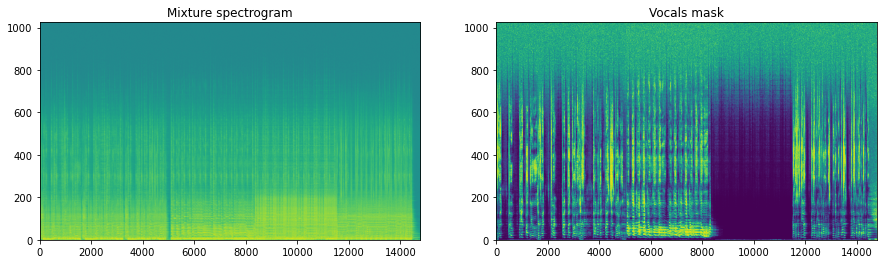

In [4]:
# Creation of the mask required for vocal source to separate it from the mixture.
mask = vocals_representation / (np.maximum(vocals_representation, representation) + 1e-8)

# Visualization of the mask.

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0], origin='lower', aspect='auto')
ax[1].set_title('Vocals mask')
plt.show()

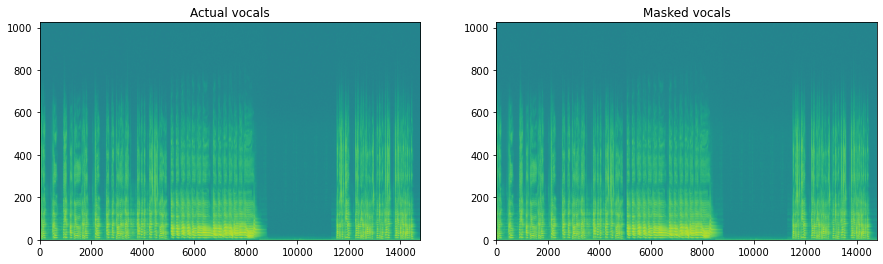

In [5]:
# Application of the mask (multipy mask with miwture representation)

masked = mask * representation

# Now we see the Real vocals and Estimate vocals

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Actual vocals')
ax[1].imshow(20 * np.log10(masked[..., 0]), origin='lower', aspect='auto')
ax[1].set_title('Masked vocals')
plt.show()

In [6]:
#Let’s listen to the estimate vocals

mix_phase = np.angle(signal_mix.stft())
masked_stft = masked * np.exp(1j * mix_phase)
new_signal = nussl.AudioSignal(stft=masked_stft, sample_rate=signal_mix.sample_rate)
new_signal.istft()
new_signal.embed_audio(display=False)

# Masking operation with PyTorch tensors

In [36]:
representation = np.abs(signal_mix.stft())
representation1 = np.abs(signal_mix1.stft())
representation2 = np.abs(signal_mix2.stft())
representation3 = np.abs(signal_mix3.stft())
representation4 = np.abs(signal_mix4.stft())

vocals_representation = np.abs(signal_vocal.stft())
vocals_representation1 = np.abs(signal_vocal1.stft())
vocals_representation2 = np.abs(signal_vocal2.stft())
vocals_representation3 = np.abs(signal_vocal3.stft())
vocals_representation4 = np.abs(signal_vocal4.stft())

drums_representation = np.abs(signal_drums.stft())
drums_representation1 = np.abs(signal_drums1.stft())
drums_representation2 = np.abs(signal_drums2.stft())
drums_representation3 = np.abs(signal_drums3.stft())
drums_representation4 = np.abs(signal_drums4.stft())

bass_representation = np.abs(signal_bass.stft())
bass_representation1 = np.abs(signal_bass1.stft())
bass_representation2 = np.abs(signal_bass2.stft())
bass_representation3 = np.abs(signal_bass3.stft())
bass_representation4 = np.abs(signal_bass4.stft())

other_representation =np.abs(signal_other.stft())
other_representation1 =np.abs(signal_other1.stft())
other_representation2 =np.abs(signal_other2.stft())
other_representation3 =np.abs(signal_other3.stft())
other_representation4 =np.abs(signal_other4.stft())

#From numpy to torch
mix_tensor = torch.from_numpy(representation)
mix_tensor1 = torch.from_numpy(representation1)
mix_tensor2 = torch.from_numpy(representation2)
mix_tensor3 = torch.from_numpy(representation3)
mix_tensor4 = torch.from_numpy(representation4)

vocal_tensor = torch.from_numpy(vocals_representation)
vocal_tensor1 = torch.from_numpy(vocals_representation1)
vocal_tensor2 = torch.from_numpy(vocals_representation2)
vocal_tensor3 = torch.from_numpy(vocals_representation3)
vocal_tensor4 = torch.from_numpy(vocals_representation4)

drums_tensor = torch.from_numpy(drums_representation)
drums_tensor1 = torch.from_numpy(drums_representation1)
drums_tensor2 = torch.from_numpy(drums_representation2)
drums_tensor3 = torch.from_numpy(drums_representation3)
drums_tensor4 = torch.from_numpy(drums_representation4)

bass_tensor = torch.from_numpy(bass_representation)
bass_tensor1 = torch.from_numpy(bass_representation1)
bass_tensor2 = torch.from_numpy(bass_representation2)
bass_tensor3 = torch.from_numpy(bass_representation3)
bass_tensor4 = torch.from_numpy(bass_representation4)

other_tensor = torch.from_numpy(other_representation)
other_tensor1 = torch.from_numpy(other_representation1)
other_tensor2 = torch.from_numpy(other_representation2)
other_tensor3 = torch.from_numpy(other_representation3)
other_tensor4 = torch.from_numpy(other_representation4)

# #Masked operation 
# mask_mix_tensor = torch.rand_like(mix_tensor.unsqueeze(-1))
# mask_vocal_tensor = torch.rand_like(vocal_tensor.unsqueeze(-1))

# # shapes
# print(mix_tensor.shape, mask_vocal_tensor.shape)

# # Application of the mask
# masked_tensor = mix_tensor.unsqueeze(-1) * mask_vocal_tensor

# print(masked_tensor.shape)

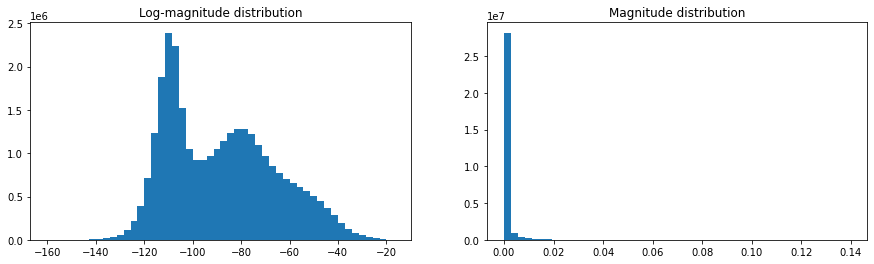

In [14]:
#This model compute the log-magnitude representation cause is more much friendly
#for neural network training

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].hist(20 * np.log10(np.maximum(representation, 1e-8)).flatten(), bins=50)
ax[0].set_title('Log-magnitude distribution')
ax[1].hist(representation.flatten(), bins=50)
ax[1].set_title('Magnitude distribution')
plt.show()

In [37]:
from nussl.ml.networks.modules import AmplitudeToDB

amplitude_to_db = AmplitudeToDB()
mix_log_amplitude = amplitude_to_db(mix_tensor)
mix_log_amplitude1 = amplitude_to_db(mix_tensor1)
mix_log_amplitude2 = amplitude_to_db(mix_tensor2)
mix_log_amplitude3 = amplitude_to_db(mix_tensor3)
mix_log_amplitude4 = amplitude_to_db(mix_tensor4)

vocal_log_amplitude = amplitude_to_db(vocal_tensor)
vocal_log_amplitude1 = amplitude_to_db(vocal_tensor1)
vocal_log_amplitude2 = amplitude_to_db(vocal_tensor2)
vocal_log_amplitude3 = amplitude_to_db(vocal_tensor3)
vocal_log_amplitude4 = amplitude_to_db(vocal_tensor4)

drums_log_amplitude = amplitude_to_db(drums_tensor)
drums_log_amplitude1 = amplitude_to_db(drums_tensor1)
drums_log_amplitude2 = amplitude_to_db(drums_tensor2)
drums_log_amplitude3 = amplitude_to_db(drums_tensor3)
drums_log_amplitude4 = amplitude_to_db(drums_tensor4)

bass_log_amplitude = amplitude_to_db(bass_tensor)
bass_log_amplitude1 = amplitude_to_db(bass_tensor1)
bass_log_amplitude2 = amplitude_to_db(bass_tensor2)
bass_log_amplitude3 = amplitude_to_db(bass_tensor3)
bass_log_amplitude4 = amplitude_to_db(bass_tensor4)

other_log_amplitude = amplitude_to_db(other_tensor)
other_log_amplitude1 = amplitude_to_db(other_tensor1)
other_log_amplitude2 = amplitude_to_db(other_tensor2)
other_log_amplitude3 = amplitude_to_db(other_tensor3)
other_log_amplitude4 = amplitude_to_db(other_tensor4)

print(mix_tensor.mean(), mix_log_amplitude.mean())
print(vocal_tensor.mean(), vocal_log_amplitude.mean())

tensor(0.0009) tensor(-73.9505)
tensor(0.0002) tensor(-78.2084)


In [38]:
# Reshape the a bit for future

print("Shape before (nf, nt, nac): ", mix_tensor.shape)

mix_tensor = mix_tensor.permute(1, 0, 2).unsqueeze(0).float()
mix_tensor1 = mix_tensor1.permute(1, 0, 2).unsqueeze(0).float()
mix_tensor2 = mix_tensor2.permute(1, 0, 2).unsqueeze(0).float()
mix_tensor3 = mix_tensor3.permute(1, 0, 2).unsqueeze(0).float()
mix_tensor4 = mix_tensor4.permute(1, 0, 2).unsqueeze(0).float()

print("\nShape after (nb: Batch size, nt: # of time steps , nf: frequency bins, nac: # of audio channels):", mix_tensor.shape)

Shape before (nf, nt, nac):  torch.Size([1025, 14768, 2])

Shape after (nb: Batch size, nt: # of time steps , nf: frequency bins, nac: # of audio channels): torch.Size([1, 14768, 1025, 2])


In [39]:
# Reshape the a bit for future

print("Shape before (nf, nt, nac): ", vocal_tensor.shape)

vocal_tensor = vocal_tensor.permute(1, 0, 2).unsqueeze(0).float()
vocal_tensor1 = vocal_tensor1.permute(1, 0, 2).unsqueeze(0).float()
vocal_tensor2 = vocal_tensor2.permute(1, 0, 2).unsqueeze(0).float()
vocal_tensor3 = vocal_tensor3.permute(1, 0, 2).unsqueeze(0).float()
vocal_tensor4 = vocal_tensor4.permute(1, 0, 2).unsqueeze(0).float()

drums_tensor = drums_tensor.permute(1, 0, 2).unsqueeze(0).float()
drums_tensor1 = drums_tensor1.permute(1, 0, 2).unsqueeze(0).float()
drums_tensor2 = drums_tensor2.permute(1, 0, 2).unsqueeze(0).float()
drums_tensor3 = drums_tensor3.permute(1, 0, 2).unsqueeze(0).float()
drums_tensor4 = drums_tensor4.permute(1, 0, 2).unsqueeze(0).float()

bass_tensor = bass_tensor.permute(1, 0, 2).unsqueeze(0).float()
bass_tensor1 = bass_tensor1.permute(1, 0, 2).unsqueeze(0).float()
bass_tensor2 = bass_tensor2.permute(1, 0, 2).unsqueeze(0).float()
bass_tensor3 = bass_tensor3.permute(1, 0, 2).unsqueeze(0).float()
bass_tensor4 = bass_tensor4.permute(1, 0, 2).unsqueeze(0).float()

other_tensor = other_tensor.permute(1, 0, 2).unsqueeze(0).float()
other_tensor1 = other_tensor1.permute(1, 0, 2).unsqueeze(0).float()
other_tensor2 = other_tensor2.permute(1, 0, 2).unsqueeze(0).float()
other_tensor3 = other_tensor3.permute(1, 0, 2).unsqueeze(0).float()
other_tensor4 = other_tensor4.permute(1, 0, 2).unsqueeze(0).float()

print("\nShape after (nb: Batch size, nt: # of time steps , nf: frequency bins, nac: # of audio channels):", vocal_tensor.shape)

Shape before (nf, nt, nac):  torch.Size([1025, 14768, 2])

Shape after (nb: Batch size, nt: # of time steps , nf: frequency bins, nac: # of audio channels): torch.Size([1, 14768, 1025, 2])


# First building block.

In [43]:
class Model(nn.Module):
    """The model takes a spectogram and computes the log magnitude features"""
    def __init__(self):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
    
    def forward(self, data):
        data = self.amplitude_to_db(data)
        return data
    
model = Model()
mix_log_amplitude = model(mix_tensor)
vocal_log_amplitude = model(vocal_tensor)

# Input normalization

Input normalization is a critical feature of most deep separation models. In neural networks, activation functions work best within a limited range of values. For example, let’s look at a plot of the Sigmoid activation function:

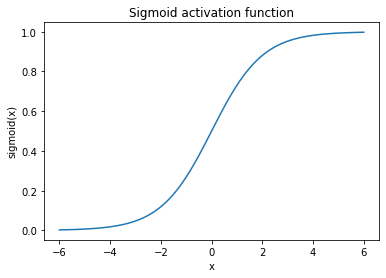

The “good” range for the Sigmoid function is between -6 and 6. 


In [44]:
x = torch.linspace(-6, 6, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()
print('The “good” range for the Sigmoid function is between -6 and 6. ')

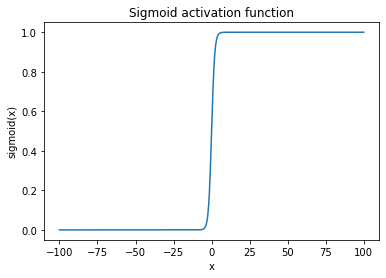

That happens if you go further out


In [45]:
x = torch.linspace(-100, 100, 1000)
y = torch.sigmoid(x)
plt.plot(to_numpy(x), to_numpy(y))
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.title('Sigmoid activation function')
plt.show()
print('That happens if you go further out')

# Normalization with BatchNorm layer of nussl

In [46]:
from nussl.ml.networks.modules import BatchNorm

def print_stats(data):
    print(
        f"Shape: {data.shape}\n"
        f"Mean: {data.mean().item()}\n"
        f"Var: {data.var().item()}\n"
    )

input_normalization = BatchNorm(num_features=mix_tensor.shape[2])
mix_log_amplitude = amplitude_to_db(mix_tensor)

print_stats(mix_tensor)
print_stats(mix_log_amplitude)

normalized = input_normalization(mix_log_amplitude)

print_stats(mix_log_amplitude)
print_stats(normalized)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0008602337911725044
Var: 1.540517041576095e-05

Shape: torch.Size([1, 14768, 1025, 2])
Mean: -73.95046997070312
Var: 121.15862274169922

Shape: torch.Size([1, 14768, 1025, 2])
Mean: -73.95046997070312
Var: 121.15862274169922

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 1.7116656181315193e-06
Var: 0.7282313704490662



In [47]:
input_normalization2 = BatchNorm(num_features=vocal_tensor.shape[2])
vocal_log_amplitude = amplitude_to_db(vocal_tensor)

print_stats(vocal_tensor)
print_stats(vocal_log_amplitude)

normalized2 = input_normalization2(vocal_log_amplitude)

print_stats(vocal_log_amplitude)
print_stats(normalized2)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0001591843320056796
Var: 1.1740376066882163e-06

Shape: torch.Size([1, 14768, 1025, 2])
Mean: -78.20841979980469
Var: 31.874170303344727

Shape: torch.Size([1, 14768, 1025, 2])
Mean: -78.20841979980469
Var: 31.874170303344727

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 2.110836021529394e-06
Var: 0.6594164371490479



# Second building block (Normalization).

In [48]:
class Model(nn.Module):
    def __init__(self, num_features):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
    
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        return data

num_features = mix_tensor.shape[2]
model = Model(num_features)
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0008602337911725044
Var: 1.540517041576095e-05

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 1.7116656181315193e-06
Var: 0.7282313704490662



In [49]:
num_features2 = vocal_tensor.shape[2]
model2 = Model(num_features2)
output2 = model2(vocal_tensor)

print_stats(vocal_tensor)
print_stats(output2)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0001591843320056796
Var: 1.1740376066882163e-06

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 2.110836021529394e-06
Var: 0.6594164371490479



# Recurrent processing with RecurrentStack

In [50]:
from nussl.ml.networks.modules import RecurrentStack

nb, nt, nf, nac = mix_tensor.shape
recurrent_stack = RecurrentStack(
    nf * nac, 
    hidden_size=50, 
    num_layers=2, 
    bidirectional=True, 
    dropout=0.3
)

output = recurrent_stack(normalized)
print_stats(mix_tensor)
print_stats(output)
print(mix_tensor.shape)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0008602337911725044
Var: 1.540517041576095e-05

Shape: torch.Size([1, 14768, 100])
Mean: 0.004780795890837908
Var: 0.1325504183769226

torch.Size([1, 14768, 1025, 2])


In [26]:
nb, nt, nf, nac = vocal_tensor.shape
recurrent_stack2 = RecurrentStack(
    nf * nac, 
    hidden_size=50, 
    num_layers=2, 
    bidirectional=True, 
    dropout=0.3)

output2 = recurrent_stack2(normalized2)
print_stats(vocal_tensor)
print_stats(output2)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0001591843320056796
Var: 1.1740376066882163e-06

Shape: torch.Size([1, 14768, 100])
Mean: -0.00935317948460579
Var: 0.13796204328536987



In [27]:
mix_tensor.shape

torch.Size([1, 14768, 1025, 2])

In [28]:
vocal_tensor.shape

torch.Size([1, 14768, 1025, 2])

# Third building block (Recurrent processing).

In [29]:
class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3)
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0008602337911725044
Var: 1.540517041576095e-05

Shape: torch.Size([1, 14768, 100])
Mean: -0.01385024469345808
Var: 0.13084973394870758



In [30]:
nb, nt, nf, nac = vocal_tensor.shape
model2 = Model(nf, nac, 50, 2, True, 0.3)
output2 = model2(vocal_tensor)

print_stats(vocal_tensor)
print_stats(output2)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0001591843320056796
Var: 1.1740376066882163e-06

Shape: torch.Size([1, 14768, 100])
Mean: -0.009175301529467106
Var: 0.13368478417396545



# Fourth building block (Mapping to a mask)

In [51]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, data):
        data = self.amplitude_to_db(data)
        data = self.input_normalization(data)
        data = self.recurrent_stack(data)
        data = self.embedding(data)
        return data

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output = model(mix_tensor)

print_stats(mix_tensor)
print_stats(output)

RuntimeError: bad allocation

In [32]:
nb, nt, nf, nac = vocal_tensor.shape
model2 = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output2 = model2(vocal_tensor)

print_stats(vocal_tensor)
print_stats(output2)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0001591843320056796
Var: 1.1740376066882163e-06

Shape: torch.Size([1, 14768, 1025, 2, 1])
Mean: 0.50006502866745
Var: 0.0007662089192308486



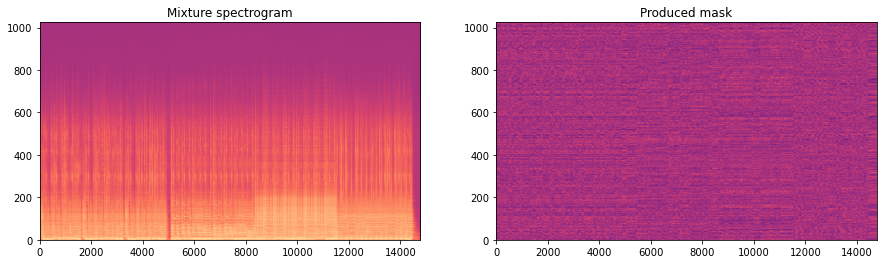

In [33]:
#Mixture spectogram outpout mask

mask = to_numpy(output[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(mask[..., 0].T, origin='lower', aspect='auto', cmap='magma')
ax[1].set_title('Produced mask')
plt.show()

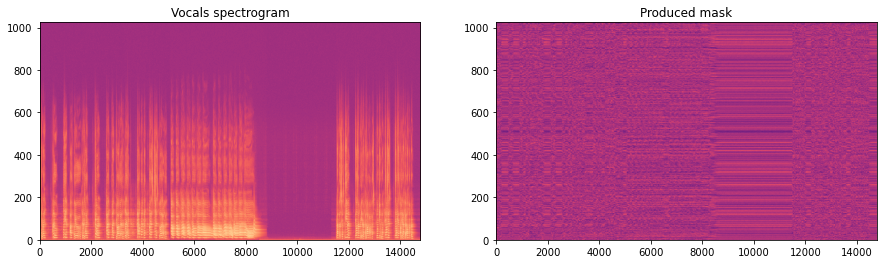

In [34]:
#Vocals spectogram outpout mask

mask2 = to_numpy(output2[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto', cmap='magma')
ax[0].set_title('Vocals spectrogram')
ax[1].imshow(mask2[..., 0].T, origin='lower', aspect='auto', cmap='magma')
ax[1].set_title('Produced mask')
plt.show()

# Final building block (Applying the mask)

In [42]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, num_sources, 
                activation='sigmoid'):
        super().__init__()
        
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   num_sources, activation, 
                                   num_audio_channels)
        
    def forward(self, other, bass, drums, vocals, mixture):
        mix_magnitude = mixture # save mixture for masking
        vocal_magnitude = vocals
        drums_magnitude = drums
        bass_magnitude = bass
        other_magnitude = other
        
        mixture = self.amplitude_to_db(mix_magnitude)
        mixture = self.input_normalization(mixture)
        mixture = self.recurrent_stack(mixture)
        mask = self.embedding(mixture)
        
        vocals_estimate = vocal_magnitude.unsqueeze(-1) * mask
        drums_estimate = drums_magnitude.unsqueeze(-1) * mask
        bass_estimate = bass_magnitude.unsqueeze(-1) * mask
        other_estimate = other_magnitude.unsqueeze(-1) * mask
        
        return vocals_estimate, drums_estimate, bass_estimate, other_estimate

nb, nt, nf, nac = mix_tensor.shape
model = Model(nf, nac, 50, 2, True, 0.3, 1, 'sigmoid')
output_vocal, output_drums, output_bass, output_other  = model(other_tensor,bass_tensor,drums_tensor,vocal_tensor,mix_tensor)


NameError: name 'BatchNorm' is not defined

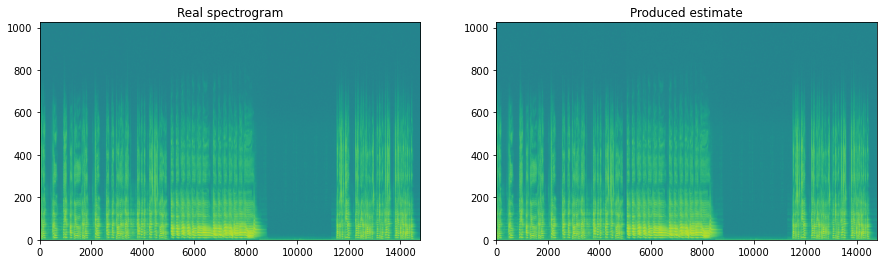

In [36]:
estimate = to_numpy(output_vocal[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(vocals_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Real spectrogram')
ax[1].imshow(20 * np.log10(estimate[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

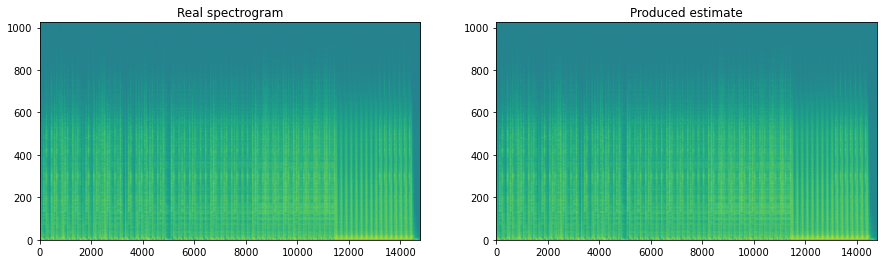

In [37]:
estimate1 = to_numpy(output_drums[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(drums_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Real spectrogram')
ax[1].imshow(20 * np.log10(estimate1[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

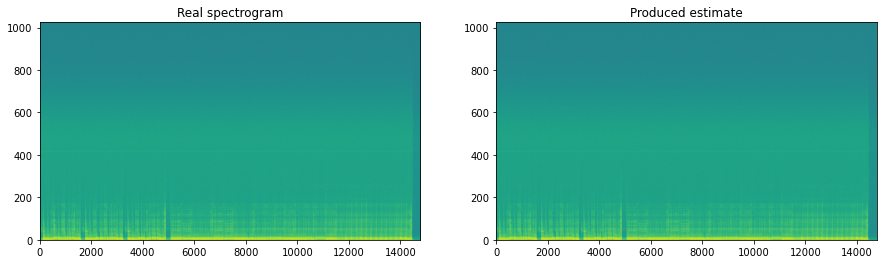

In [38]:
estimate2 = to_numpy(output_bass[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(bass_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Real spectrogram')
ax[1].imshow(20 * np.log10(estimate2[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

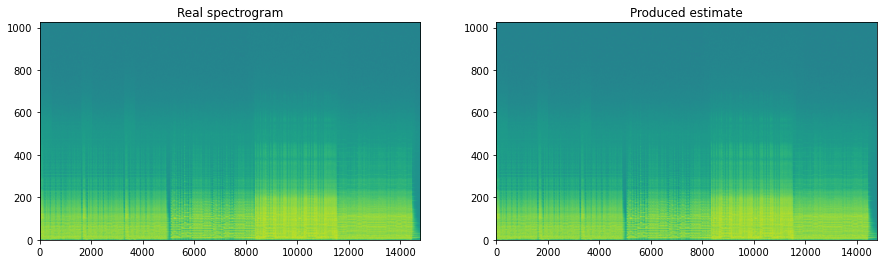

In [39]:
estimate3 = to_numpy(output_other[0, ..., 0])

fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(other_representation[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Real spectrogram')
ax[1].imshow(20 * np.log10(estimate3[..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

# Another model can be  a waveform in/waveform out model

In [40]:
from nussl.ml.networks.modules import STFT

#Move the computation of the STFT and inverse STFT
stft = STFT(2048, hop_length=512)
mix_audio = torch.from_numpy(signal_mix.audio_data).unsqueeze(0).float()
scipy_mag = np.abs(signal_mix.stft())
torch_stft = stft(mix_audio, direction='transform')
print(torch_stft.shape, scipy_mag.shape)

torch.Size([1, 14768, 2050, 2]) (1025, 14768, 2)


In [41]:
stft = STFT(2048, hop_length=512)
vocal_audio = torch.from_numpy(signal_vocal.audio_data).unsqueeze(0).float()
scipy_mag2 = np.abs(signal_vocal.stft())
torch_stft2 = stft(vocal_audio, direction='transform')
print(torch_stft2.shape, scipy_mag2.shape)

torch.Size([1, 14768, 2050, 2]) (1025, 14768, 2)


In [42]:
stft = STFT(2048, hop_length=512)
drums_audio = torch.from_numpy(signal_drums.audio_data).unsqueeze(0).float()
scipy_mag3 = np.abs(signal_drums.stft())
torch_stft3 = stft(drums_audio, direction='transform')
print(torch_stft3.shape, scipy_mag3.shape)

torch.Size([1, 14768, 2050, 2]) (1025, 14768, 2)


torch.Size([1, 14768, 2, 1025, 2])
torch.Size([1, 14768, 1025, 2])


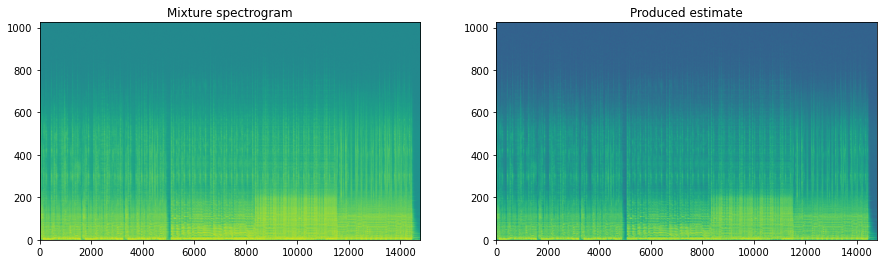

In [59]:
nb, nt, nf, nac = torch_stft.shape

# Stack the real/imag along the second to last axis
torch_stft = torch_stft.reshape(nb, nt, 2, -1, nac)
print(torch_stft.shape)

# Compute the magnitude
torch_mag, torch_phase = torch_stft[:, :, 0, ...], torch_stft[:, :, 1, ...]
print(torch_mag.shape)

# Show the magnitude spectrogram of the torch STFT
fig, ax = plt.subplots(1, 2, figsize=(15, 4))
ax[0].imshow(20 * np.log10(scipy_mag[..., 0]), origin='lower', aspect='auto')
ax[0].set_title('Mixture spectrogram')
ax[1].imshow(20 * np.log10(torch_mag[0, ..., 0].T), origin='lower', aspect='auto')
ax[1].set_title('Produced estimate')
plt.show()

# Modify our last model so that it takes the STFT and iSTFT

In [60]:
from nussl.ml.networks.modules import Embedding

class Model(nn.Module):
    def __init__(self, num_features, num_audio_channels, hidden_size,
                 num_layers, bidirectional, dropout, embedding_size, 
                 num_filters, hop_length, window_type='sqrt_hann', # New STFT parameters
                 activation=['sigmoid', 'unit_norm']):
        super().__init__()
        
        self.stft = STFT(
            num_filters, 
            hop_length=hop_length, 
            window_type=window_type
        )
        self.amplitude_to_db = AmplitudeToDB()
        self.input_normalization = BatchNorm(num_features)
        self.recurrent_stack = RecurrentStack(
            num_features * num_audio_channels, hidden_size, 
            num_layers, bool(bidirectional), dropout
        )
        hidden_size = hidden_size * (int(bidirectional) + 1)
        self.embedding = Embedding(num_features, hidden_size, 
                                   embedding_size, activation, 
                                   num_audio_channels)
        
    def forward(self, vocals, mixture):
        mix_magnitude = mixture # save mixture for masking
        vocal_magnitude = vocals #mask
        mix_stft = self.stft(mixture, direction='transform')
        vocal_stft = self.stft(vocals, direction='transform')
        nb, nt, nf, nac = mix_stft.shape
        nb1, nt1, nf1, nac1 = vocal_stft.shape
        # Stack the mag/phase along the second to last axis
        mix_stft = mix_stft.reshape(nb, nt, 2, -1, nac)
        vocal_stft = vocal_stft.reshape(nb1, nt1, 2, -1, nac1)
        mix_magnitude = mix_stft[:, :, 0, ...] # save for masking
        vocal_magnitude = vocal_stft[:, :, 0, ...] # save for masking
        vocal_phase = vocal_stft[:, :, 1, ...] # save for reconstruction
        
        mixture = self.amplitude_to_db(mix_magnitude)
        mixture = self.input_normalization(mixture)
        mixture = self.recurrent_stack(mixture)
        mask = self.embedding(mixture)
        
        estimates = vocal_magnitude.unsqueeze(-1) * mask
        
        # Recombine estimates with mixture phase
        vocal_phase = vocal_phase.unsqueeze(-1).expand_as(estimates)
        estimates = torch.cat([estimates, vocal_phase], dim=2)
        estimate_audio = self.stft(estimates, direction='inverse')
        
        return estimate_audio
    

model = Model(1025, 2, 50, 2, True, 0.3, 2, 2048, 512)
output = model(vocal_audio, mix_audio)

print_stats(mix_tensor)
print_stats(output)

Shape: torch.Size([1, 14768, 1025, 2])
Mean: 0.0008602337911725044
Var: 1.540517041576095e-05

Shape: torch.Size([1, 2, 7560512, 2])
Mean: -8.96854544407688e-06
Var: 0.000996262882836163



In [64]:
for i in range(output.shape[-1]):
    source = output[0, ..., 1]
    nussl.AudioSignal(audio_data_array=to_numpy(source), sample_rate=44100).embed_audio()